In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [2]:
df=pd.read_csv("file:///F:/diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
import plotly.express as px
import plotly.graph_objects as go

#Data Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler


In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
df.shape

(768, 9)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [7]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [8]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [9]:
select_col = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

In [10]:
df.max()

Pregnancies                  17.00
Glucose                     199.00
BloodPressure               122.00
SkinThickness                99.00
Insulin                     846.00
BMI                          67.10
DiabetesPedigreeFunction      2.42
Age                          81.00
Outcome                       1.00
dtype: float64

In [12]:
df.mean()

Pregnancies                   3.845052
Glucose                     120.894531
BloodPressure                69.105469
SkinThickness                20.536458
Insulin                      79.799479
BMI                          31.992578
DiabetesPedigreeFunction      0.471876
Age                          33.240885
Outcome                       0.348958
dtype: float64

In [13]:
df.min()

Pregnancies                  0.000
Glucose                      0.000
BloodPressure                0.000
SkinThickness                0.000
Insulin                      0.000
BMI                          0.000
DiabetesPedigreeFunction     0.078
Age                         21.000
Outcome                      0.000
dtype: float64

In [14]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

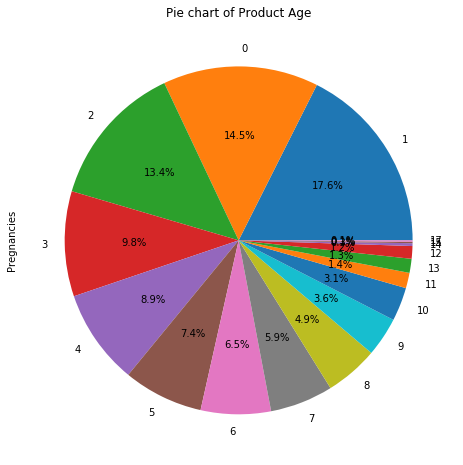

In [15]:
plt.figure(figsize=(15,8))
df['Pregnancies'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product Pregnancies")
plt.show()

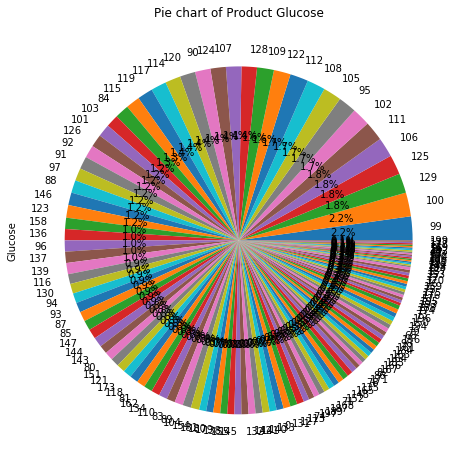

In [16]:
plt.figure(figsize=(15,8))
df['Glucose'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product Glucose")
plt.show()

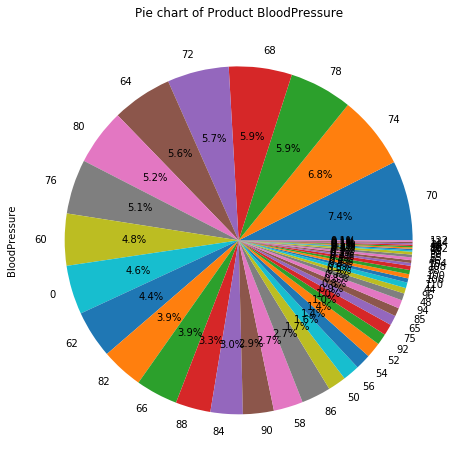

In [17]:
plt.figure(figsize=(15,8))
df['BloodPressure'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product BloodPressure")
plt.show()

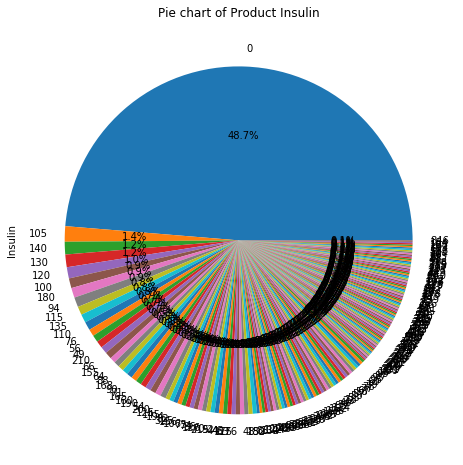

In [18]:
plt.figure(figsize=(15,8))
df['Insulin'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product Insulin")
plt.show()

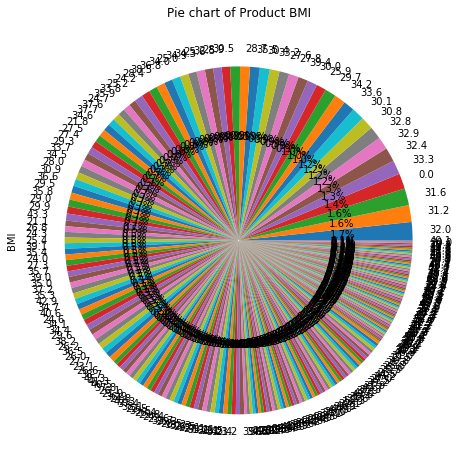

In [19]:
plt.figure(figsize=(15,8))
df['BMI'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(8,8))
plt.title("Pie chart of Product BMI")
plt.show()

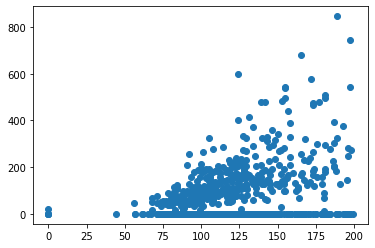

In [20]:
plt.scatter(df[['Glucose']],df['Insulin'])

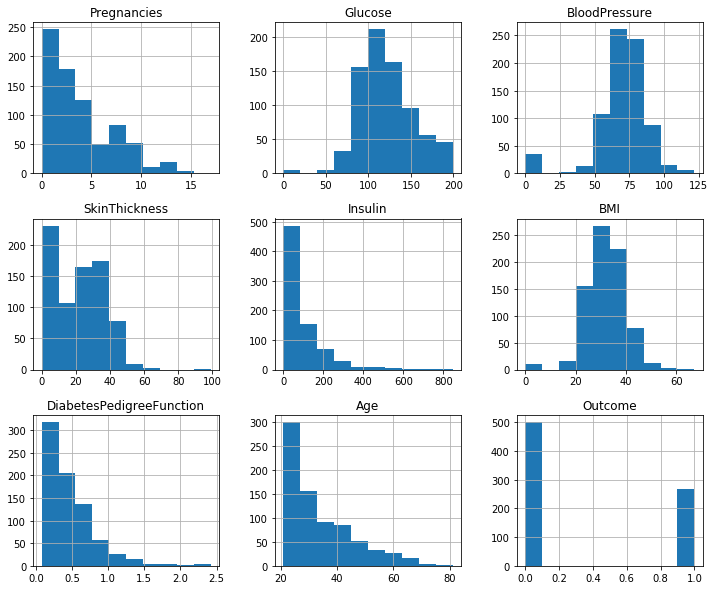

In [21]:
df.hist(figsize=(12,10))
plt.show()

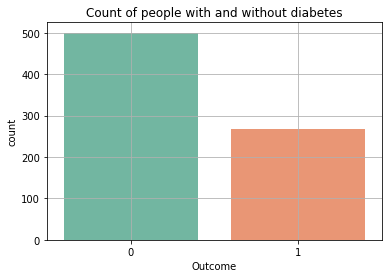

In [23]:
sns.countplot(x='Outcome',data=df, palette='Set2')
plt.title('Count of people with and without diabetes')
plt.grid()

In [24]:
df.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [28]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


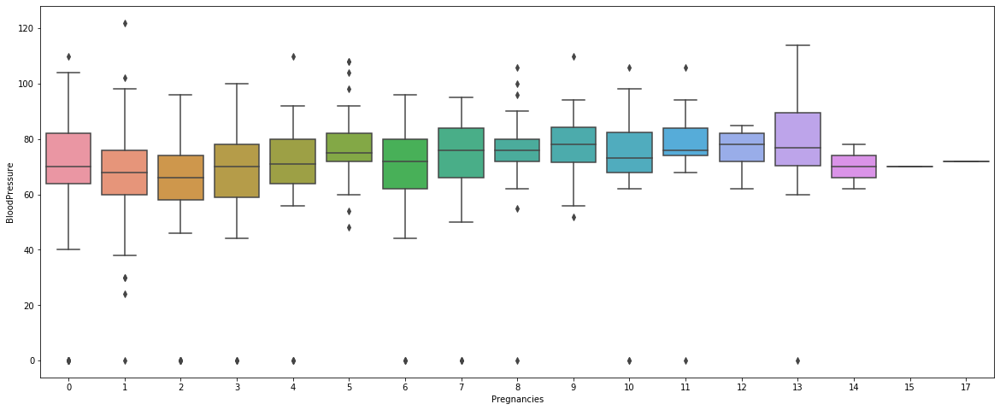

In [29]:
plt.figure(figsize=(20,8))
sns.boxplot(x='Pregnancies',y='BloodPressure',data=df)

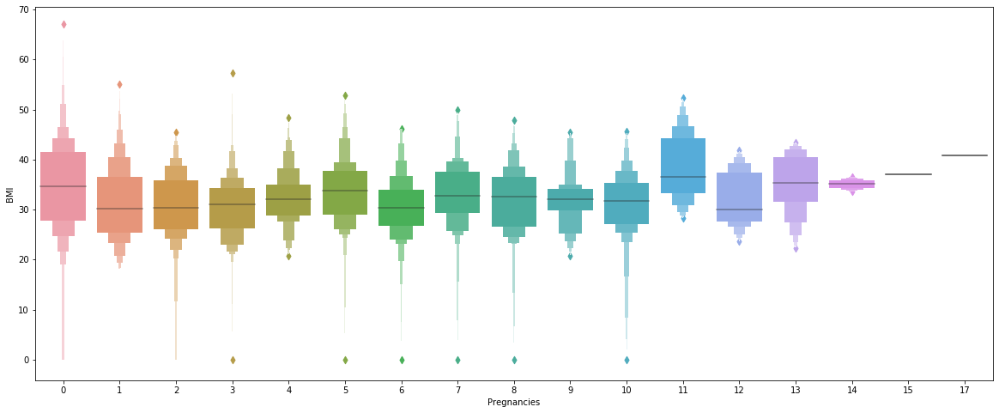

In [30]:
plt.figure(figsize=(20,8))
sns.boxenplot(x='Pregnancies',y='BMI',data=df)

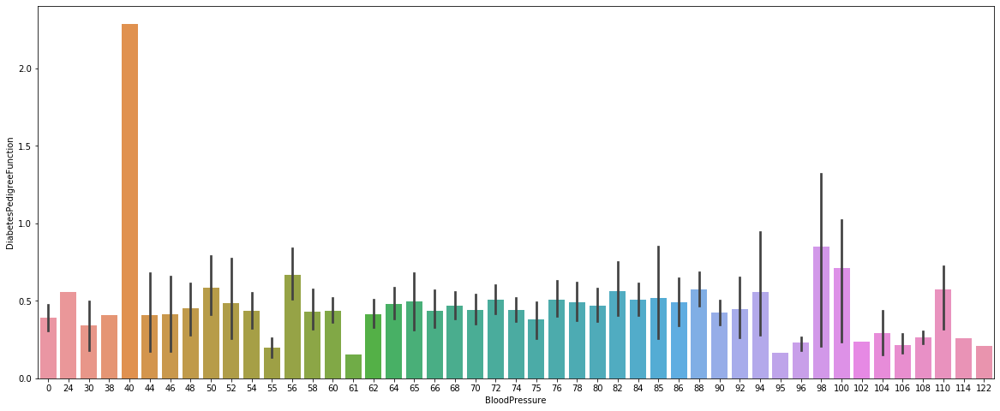

In [33]:
plt.figure(figsize=(20,8))
sns.barplot(x='BloodPressure',y='DiabetesPedigreeFunction',data=df)

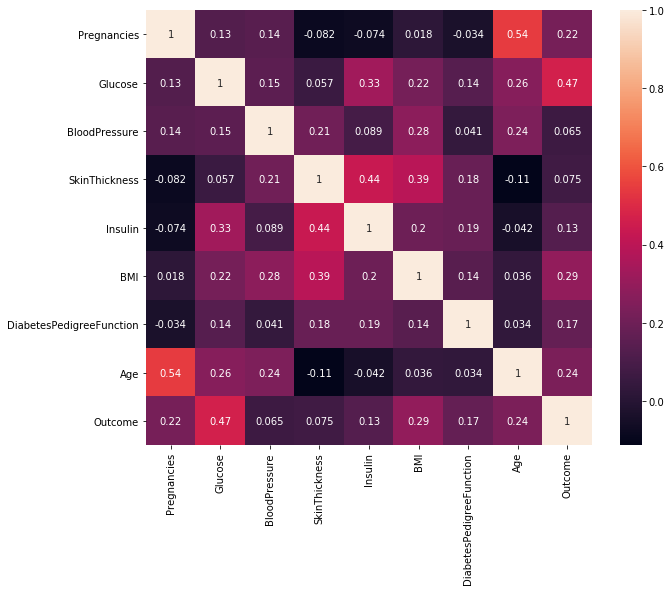

In [34]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(), annot = True)

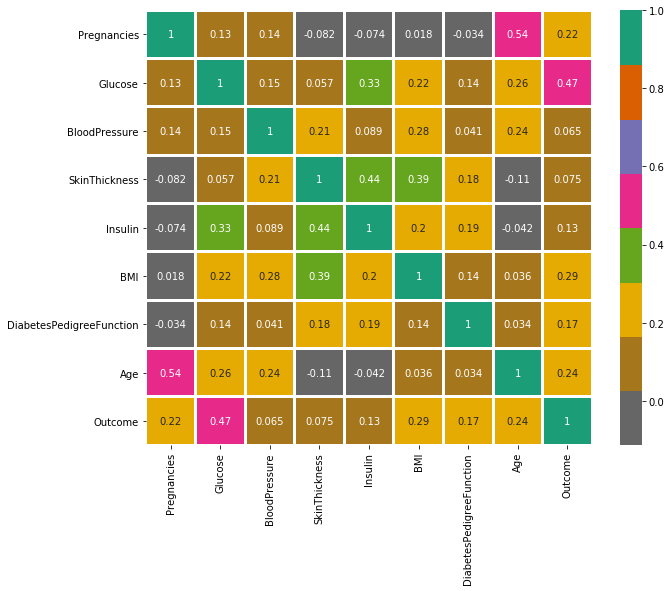

In [35]:
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(),annot=True,cmap='Dark2_r',linewidths=2)
plt.show()

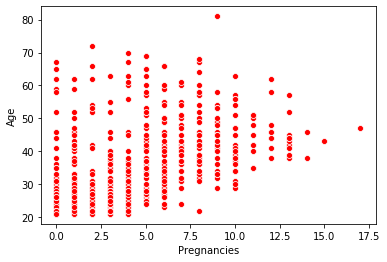

In [37]:
sns.scatterplot(x='Pregnancies', y='Age',  data=df,color='red')

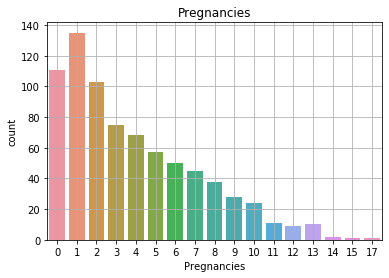

In [39]:
sns.countplot(x='Pregnancies', data=df)
plt.title('Pregnancies')
plt.grid()

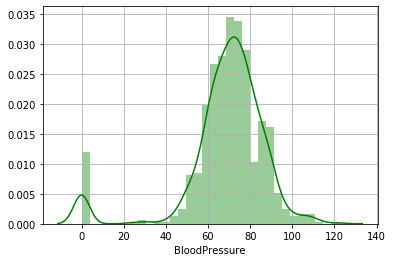

In [41]:
sns.distplot(df['BloodPressure'],kde=True, color='green')
plt.grid()

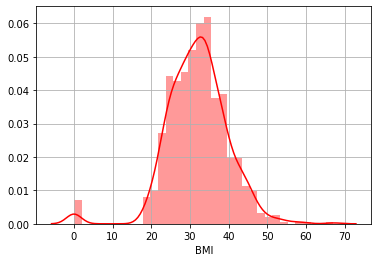

In [43]:
sns.distplot(df['BMI'], kde=True, color='red')
plt.grid()

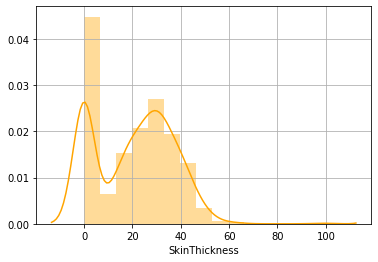

In [44]:
sns.distplot(df['SkinThickness'], kde=True, color='orange')
plt.grid()

In [45]:
# Blood pressure lower than 80 is normal

fig = px.scatter(df, x="Age", y='BloodPressure',
             size="Glucose", color="Outcome",
                 hover_data=["BMI"], log_x=True, size_max=12, 
                 color_continuous_scale=[[0, 'rgb(102, 194, 165)'], [1.0, 'rgb(225, 128, 114)']],
                 title="General view"
                 )
fig.add_shape(type="line",
    x0=20, y0=80, x1=85, y1=80,
    line=dict(color="blue",width=2,dash="dash")
 )

fig.show()

In [47]:
# We differentiate the data with Outcome 0 and 1
out_0 = df[df['Outcome']==0]
out_1 = df[df['Outcome']==1]

In [48]:
# We'll buil a function to represent de differents distributions with respect to "Outcome"
def visualization(variable):
    fig=go.Figure()
    fig.add_trace(go.Box(y=out_0[variable],name=0,marker_color='rgb(102, 194, 165)',boxpoints="all",whiskerwidth=0.3))
    fig.add_trace(go.Box(y=out_1[variable],name=1,marker_color='rgb(225, 128, 114)',boxpoints="all",whiskerwidth=0.3))
    fig.update_layout(title="{} distribution with respect to Outcome".format(variable),height=600)
    fig.show()

In [50]:
columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']

for column in df[columns]:
    visualization(column)

In [51]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


<Figure size 720x576 with 0 Axes>

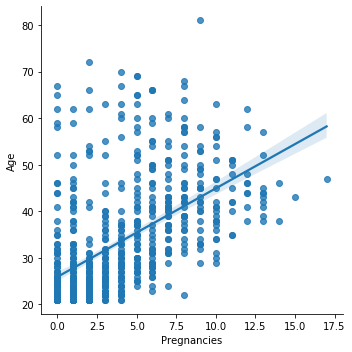

In [52]:
plt.figure(figsize=(10,8))
sns.lmplot(x="Pregnancies", y="Age",
data=df)

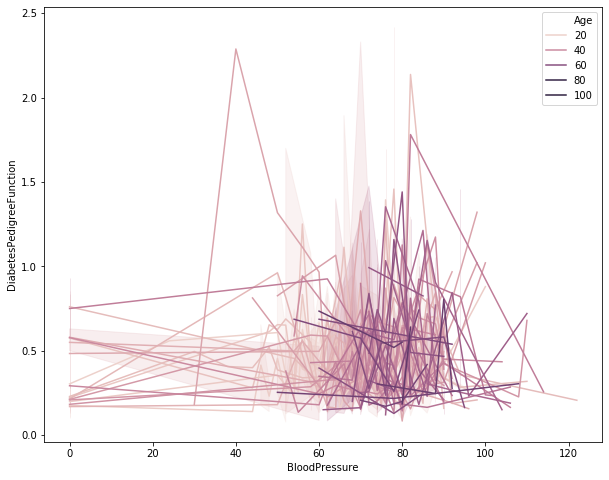

In [53]:
plt.figure(figsize=(10,8))
sns.lineplot(x="BloodPressure", y="DiabetesPedigreeFunction",hue='Age',
data=df)

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning:

The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 



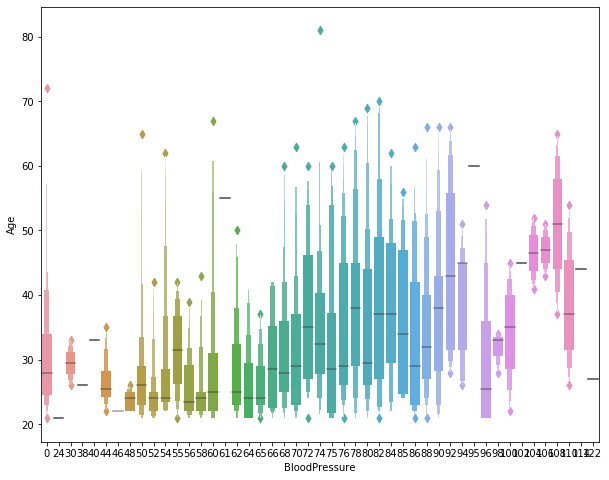

In [54]:
plt.figure(figsize=(10,8))
sns.lvplot(x="BloodPressure", y="Age",
data=df)

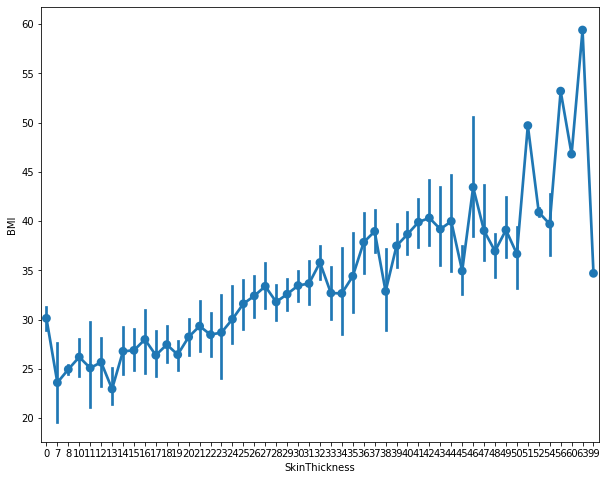

In [58]:
plt.figure(figsize=(10,8))
sns.pointplot(x="SkinThickness", y="BMI",
data=df)

<Figure size 720x576 with 0 Axes>

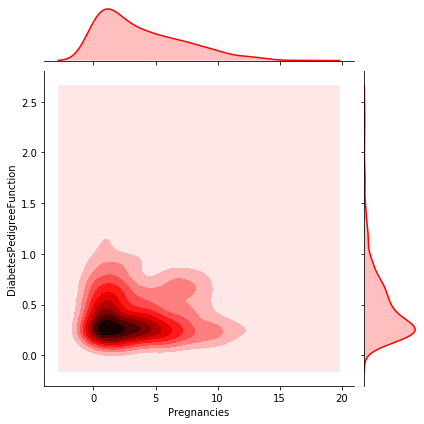

In [59]:
plt.figure(figsize=(10,8))
sns.jointplot(x="Pregnancies", y="DiabetesPedigreeFunction",
data=df,kind='kde',color='red')

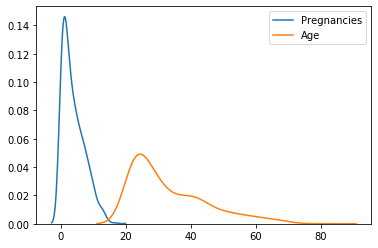

In [60]:
sns.kdeplot(df['Pregnancies'])
sns.kdeplot(df['Age'])

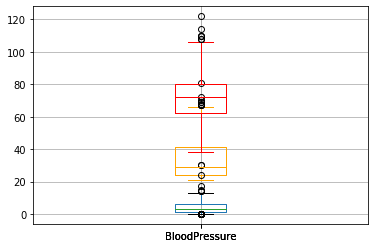

In [61]:
df.boxplot(column="Pregnancies")
df.boxplot(column="Age",color='orange')
df.boxplot(column="BloodPressure",color='red')

In [63]:
fig = px.treemap(df.groupby('Pregnancies').Age.sum().reset_index(), 
                 path=['Pregnancies'], values='Age',
                  color='Age', hover_data=['Pregnancies'],
                  title="Pregnancies by Age",
                  color_continuous_scale='RdBu')
fig.show()

In [64]:
import sweetviz as sv

In [65]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |                                             | [  0%]   00:00 ->…

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [66]:
from IPython.display import IFrame

In [67]:
IFrame(src='Analyze.html',width=1000,height=600)

In [68]:
from dataprep.eda import *

  0%|                                                                                         | 0/1293 [00:00<…

DataPrep Report
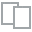
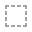
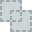
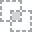
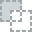
...
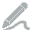
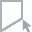
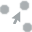
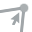
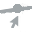

In [69]:
create_report(df)

In [72]:
x = df.iloc[:,:8]
y = df.iloc[:,8]

In [73]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [74]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [75]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3)

In [76]:
lo=LogisticRegression()
lo.fit(xtrain,ytrain)
pred_lo=lo.predict(xtest)
accu_lo=accuracy_score(ytest , pred_lo)*100
accu_lo

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



79.65367965367966

In [78]:
print(classification_report(ytest,pred_lo))

              precision    recall  f1-score   support

           0       0.82      0.91      0.86       158
           1       0.73      0.56      0.64        73

    accuracy                           0.80       231
   macro avg       0.77      0.73      0.75       231
weighted avg       0.79      0.80      0.79       231



In [79]:
tre=DecisionTreeClassifier()
tre.fit(xtrain,ytrain)
pred_tre=tre.predict(xtest)
accu_tre=accuracy_score(ytest , pred_tre)*100
accu_tre

68.3982683982684

In [80]:
print(classification_report(ytest,pred_tre))

              precision    recall  f1-score   support

           0       0.77      0.76      0.77       158
           1       0.50      0.52      0.51        73

    accuracy                           0.68       231
   macro avg       0.64      0.64      0.64       231
weighted avg       0.69      0.68      0.69       231



In [81]:
from sklearn.neighbors import KNeighborsClassifier

In [82]:
kne=KNeighborsClassifier()
kne.fit(xtrain,ytrain)
pred_kne=kne.predict(xtest)
accu_kne=accuracy_score(ytest , pred_tre)*100
accu_kne

68.3982683982684

In [83]:
print(classification_report(ytest,pred_kne))

              precision    recall  f1-score   support

           0       0.77      0.78      0.77       158
           1       0.51      0.48      0.49        73

    accuracy                           0.69       231
   macro avg       0.64      0.63      0.63       231
weighted avg       0.68      0.69      0.69       231



In [84]:
from sklearn.ensemble import AdaBoostClassifier

In [85]:
ada=AdaBoostClassifier()
ada.fit(xtrain,ytrain)
pred_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest , pred_ada)*100
accu_ada

75.75757575757575

In [86]:
print(classification_report(ytest,pred_ada))

              precision    recall  f1-score   support

           0       0.82      0.83      0.82       158
           1       0.62      0.60      0.61        73

    accuracy                           0.76       231
   macro avg       0.72      0.72      0.72       231
weighted avg       0.76      0.76      0.76       231



In [87]:
from sklearn.ensemble import BaggingClassifier

In [88]:
bag=BaggingClassifier()
bag.fit(xtrain,ytrain)
pred_bag=bag.predict(xtest)
accu_bag=accuracy_score(ytest , pred_bag)*100
accu_bag

71.42857142857143

In [89]:
print(classification_report(ytest,pred_bag))

              precision    recall  f1-score   support

           0       0.77      0.84      0.80       158
           1       0.56      0.45      0.50        73

    accuracy                           0.71       231
   macro avg       0.66      0.64      0.65       231
weighted avg       0.70      0.71      0.71       231



In [90]:
from sklearn.svm import SVC

In [91]:
svc=SVC()
svc.fit(xtrain,ytrain)
pre_siv=svc.predict(xtest)
accu_l=accuracy_score(ytest,pre_siv)*100
accu_l

78.35497835497836

In [92]:
print(classification_report(ytest,pre_siv))

              precision    recall  f1-score   support

           0       0.80      0.91      0.85       158
           1       0.73      0.51      0.60        73

    accuracy                           0.78       231
   macro avg       0.76      0.71      0.72       231
weighted avg       0.78      0.78      0.77       231



In [93]:
from sklearn.naive_bayes import GaussianNB

In [94]:
gau=GaussianNB()
gau.fit(xtrain,ytrain)
pre_gau=gau.predict(xtest)
accu_l=accuracy_score(ytest,pre_gau)*100
accu_l

74.89177489177489

In [95]:
print(classification_report(ytest,pre_gau))

              precision    recall  f1-score   support

           0       0.80      0.84      0.82       158
           1       0.61      0.56      0.59        73

    accuracy                           0.75       231
   macro avg       0.71      0.70      0.70       231
weighted avg       0.74      0.75      0.75       231



In [96]:
from sklearn.ensemble import AdaBoostClassifier

In [97]:
ada=AdaBoostClassifier()
#rdf=RandomForestClassifier()
ada.fit(xtrain,ytrain)
pre_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest,pre_ada)*100
accu_ada

75.75757575757575

In [98]:
from sklearn.ensemble import GradientBoostingClassifier

In [99]:
grd=GradientBoostingClassifier()
grd.fit(xtrain,ytrain)
pre_grd=grd.predict(xtest)
accu_grd=accuracy_score(ytest,pre_ada)*100
accu_grd

75.75757575757575

In [100]:
print(classification_report(ytest,pre_grd))

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       158
           1       0.65      0.59      0.62        73

    accuracy                           0.77       231
   macro avg       0.73      0.72      0.73       231
weighted avg       0.77      0.77      0.77       231



In [101]:
from sklearn.ensemble import ExtraTreesClassifier

In [102]:
etc=ExtraTreesClassifier()
etc.fit(xtrain,ytrain)
pre_etc=etc.predict(xtest)
accu_etc=accuracy_score(ytest,pre_etc)*100
accu_etc

73.16017316017316

In [103]:
print(classification_report(ytest,pre_grd))

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       158
           1       0.65      0.59      0.62        73

    accuracy                           0.77       231
   macro avg       0.73      0.72      0.73       231
weighted avg       0.77      0.77      0.77       231



In [104]:
models = pd.DataFrame({
    'Model': ['Logistic Reg','DecisionTreeClassifier','RandomForestClassifier',  'KNeighborsClassifier',
             'AdaBoostClassifier','BaggingClassifier','SVC','GaussianNB','AdaBoostClassifier','GradientBoostingClassifier','ExtraTreesClassifier'],
    'Score': [ accu_lo,accu_tre,accu_l, accu_kne, accu_ada,accu_bag,accu_l,accu_l,accu_ada,accu_grd,accu_etc]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,Logistic Reg,79.653680
4,AdaBoostClassifier,75.757576
8,AdaBoostClassifier,75.757576
9,GradientBoostingClassifier,75.757576
2,RandomForestClassifier,74.891775
6,SVC,74.891775
7,GaussianNB,74.891775
10,ExtraTreesClassifier,73.160173
5,BaggingClassifier,71.428571
1,DecisionTreeClassifier,68.398268


In [106]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [107]:
man=MinMaxScaler()
feat=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[feat]=man.fit_transform(df[feat])
df[feat]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.743719,0.590164,0.353535,0.000000,0.500745,0.234415,0.483333,1.0
1,0.058824,0.427136,0.540984,0.292929,0.000000,0.396423,0.116567,0.166667,0.0
2,0.470588,0.919598,0.524590,0.000000,0.000000,0.347243,0.253629,0.183333,1.0
3,0.058824,0.447236,0.540984,0.232323,0.111111,0.418778,0.038002,0.000000,0.0
4,0.000000,0.688442,0.327869,0.353535,0.198582,0.642325,0.943638,0.200000,1.0
...,...,...,...,...,...,...,...,...,...
763,0.588235,0.507538,0.622951,0.484848,0.212766,0.490313,0.039710,0.700000,0.0
764,0.117647,0.613065,0.573770,0.272727,0.000000,0.548435,0.111870,0.100000,0.0
765,0.294118,0.608040,0.590164,0.232323,0.132388,0.390462,0.071307,0.150000,0.0
766,0.058824,0.633166,0.491803,0.000000,0.000000,0.448584,0.115713,0.433333,1.0


In [108]:
std=StandardScaler()
feat=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[feat]=std.fit_transform(df[feat])
df[feat]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.639947,0.848324,0.149641,0.907270,-0.692891,0.204013,0.468492,1.425995,1.365896
1,-0.844885,-1.123396,-0.160546,0.530902,-0.692891,-0.684422,-0.365061,-0.190672,-0.732120
2,1.233880,1.943724,-0.263941,-1.288212,-0.692891,-1.103255,0.604397,-0.105584,1.365896
3,-0.844885,-0.998208,-0.160546,0.154533,0.123302,-0.494043,-0.920763,-1.041549,-0.732120
4,-1.141852,0.504055,-1.504687,0.907270,0.765836,1.409746,5.484909,-0.020496,1.365896
...,...,...,...,...,...,...,...,...,...
763,1.827813,-0.622642,0.356432,1.722735,0.870031,0.115169,-0.908682,2.532136,-0.732120
764,-0.547919,0.034598,0.046245,0.405445,-0.692891,0.610154,-0.398282,-0.531023,-0.732120
765,0.342981,0.003301,0.149641,0.154533,0.279594,-0.735190,-0.685193,-0.275760,-0.732120
766,-0.844885,0.159787,-0.470732,-1.288212,-0.692891,-0.240205,-0.371101,1.170732,1.365896
